# Parameter Tuning for Advance Lane Finding Pipeline

In this notebook, I will only go over the all parameter tuning code, tuning result and explain how I reach the decision. The lane identification and curvature is not in this notebook. A complete pipeline code would be in a [different notebook](Advance_pipeline.ipynb)

**Important! A good image process will make later pipeline logic more accurate! This is almost half of the job!**

## Package Import

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
#glob is used to reading all the similar calbration image
import glob

# import all cal images
cal_images = glob.glob ('camera_cal/calibration*.jpg')

## Camera Calibration
Using Chessboard images taken from different angle to calibrate the image distortion for our camera

In [2]:
# Arrays to store object points and image points from all images

objpoints = []
imgpoints = []

# Obj points should not change and only based on the chesss board format
# Preparing object points, like (0,0,0), (1,0,0) ...
objp = np.zeros((6*9,3),np.float32)
 
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # Creating x y coordinates

for fname in cal_images:
    # read in each image
    img = mpimg.imread(fname)
    
    # Convert to gray scale
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    # Find Chesse board corners
    ret, corners = cv2.findChessboardCorners (gray, (9,6),None)
    
    if ret:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        img = cv2.drawChessboardCorners(img,(9,6),corners,ret)
        #print (fname)
        mpimg.imsave('temp_output/'+fname, img)

Here is the output check on the finding corners
![corners](temp_output/camera_cal/calibration2.jpg)
Once I have all the Corners found and append into the imgpoints, I can operate camera calibration by using cv2 camera calibration

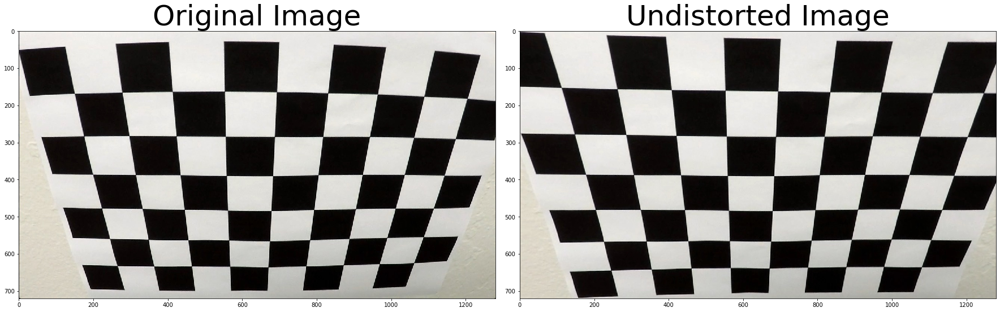

In [3]:

ret,mtx,dist,rvecs,tvecs = cv2.calibrateCamera(objpoints,imgpoints,
                                               img.shape[1:],None,None)
# Test the undistort on calibration2.jpg
test_undis_img = mpimg.imread('camera_cal/calibration2.jpg')
undist = cv2.undistort(test_undis_img,mtx,dist,None,mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_undis_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


## Color Threshold
Let's find out which color space is the best for our test images

First let's have a function will print all plots to visullize the reslut. This plot method is refereced from [Naoki Shibuya](https://github.com/naokishibuya/car-finding-lane-lines)

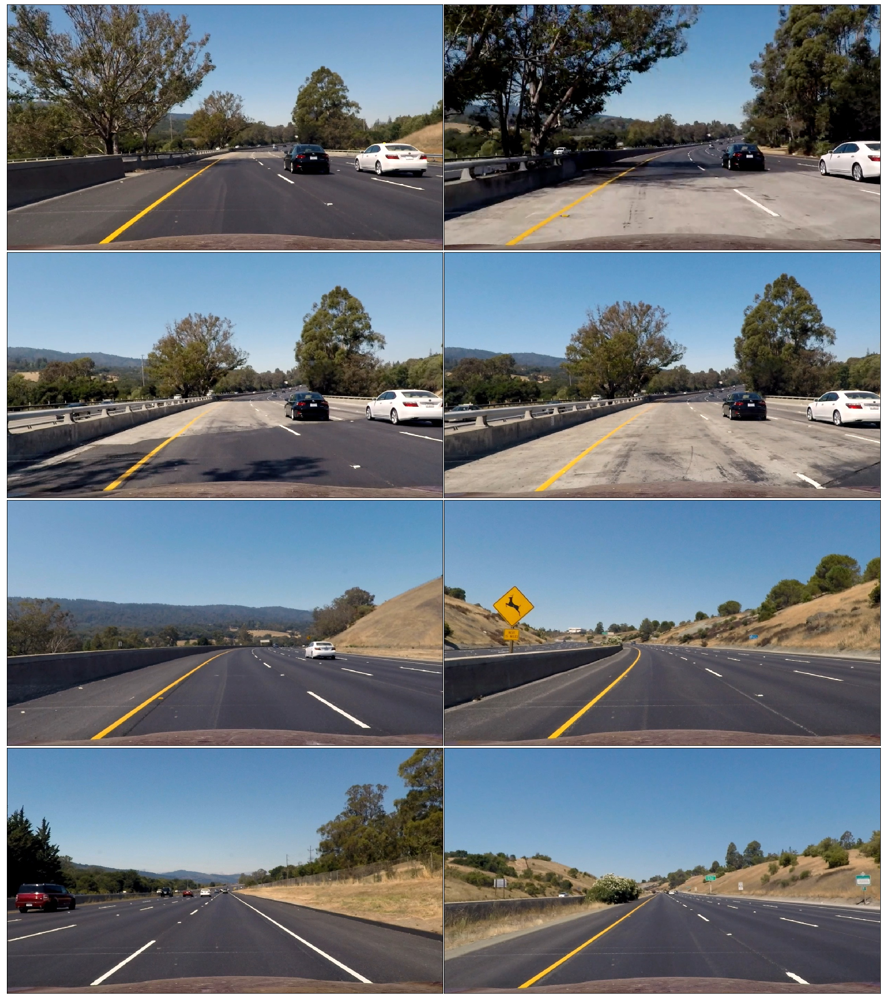

In [4]:
def show_images(images, cols = 2, cmap=None):
    rows = (len(images)+1)//cols
    
    plt.figure(figsize=(20, 22))
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        # use gray scale color map if there is only one channel
        try:
            cmap = 'gray' if len(image.shape)==2 else cmap
        except AttributeError:
            cmap = None
            
        plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

# process multi ret function using map funtion betfore feed into show images
def multi_ret_map (func,parameter):
    temp_list = list(map(func,parameter))
    result_list = []
    for i in range(len(temp_list)):
        result_list.extend(temp_list[i])
    return result_list
# Read in the test images and undistort them
test_images = [cv2.undistort(plt.imread(path),mtx,dist,None,mtx) for path in glob.glob('test_images/*.jpg')]

for i in range(len(test_images)):
    mpimg.imsave('undistort_test_images/undistort'+str(i)+'.jpg', test_images[i])
# 
show_images(test_images)

Now lets try RGB filter first with a 200 to 255 threhold value:

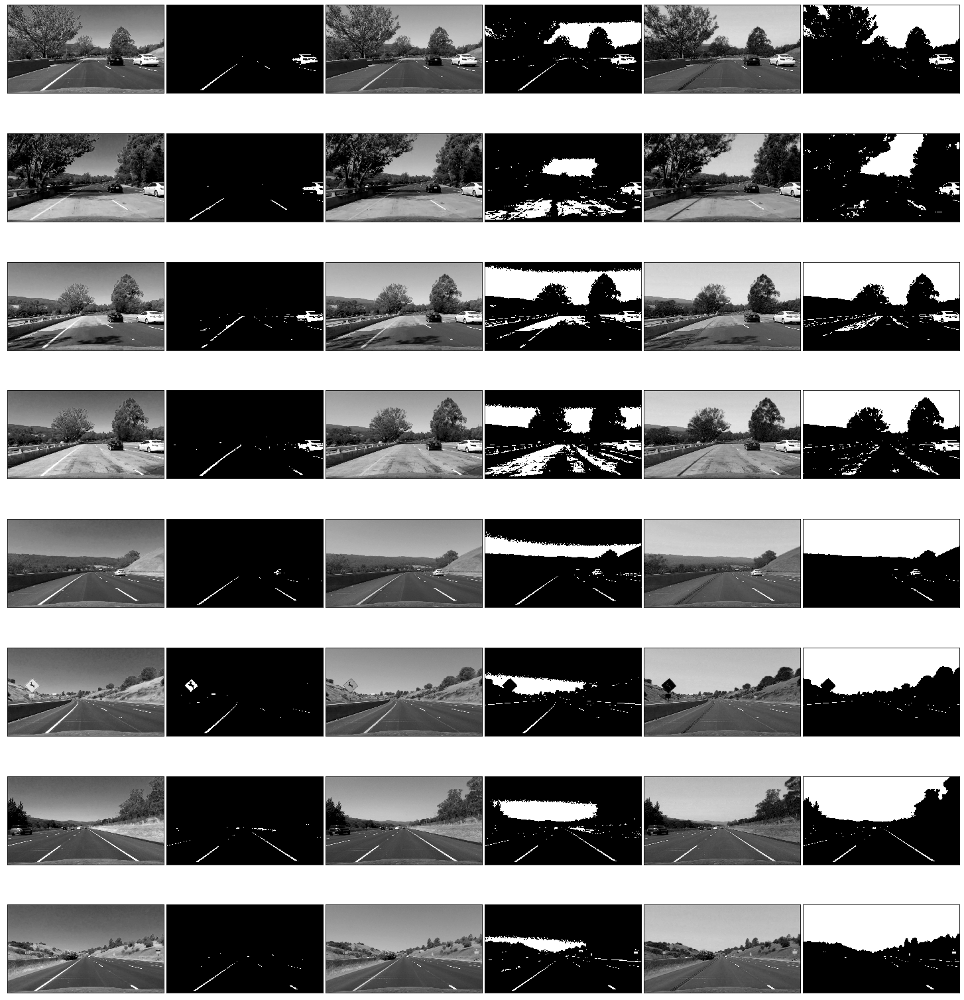

In [5]:
def covert_rgb (image): 
    R =image[:,:,0]
    G =image[:,:,1]
    B =image[:,:,2]
    thresh_r = [220,255]
    thresh_g = [170,255]
    binary_r = np.zeros_like(R)
    binary_g = np.zeros_like(G)
    binary_b = np.zeros_like(B)
    
    binary_r[(R > thresh_r[0]) & (R <= thresh_r[1])] = 1
    binary_g[(G > thresh_g[0]) & (G<= thresh_g[1])] = 1
    binary_b[(B >thresh_g[0]) & (B<= thresh_g[1])] = 1
    
    return  R,binary_r,G,binary_g,B,binary_b

    
show_images(multi_ret_map(covert_rgb,test_images), cols=6)

After experiment, only R shows a general good lane lines. Blue does not show yellow lines at all and G is failed to show plot 2 yellow line due to the pavement color change and the shadows.

However, R still is weak on low contrast area like plot 4, where pavement color is light.

Now lets experiment with HLS and HVS color space.

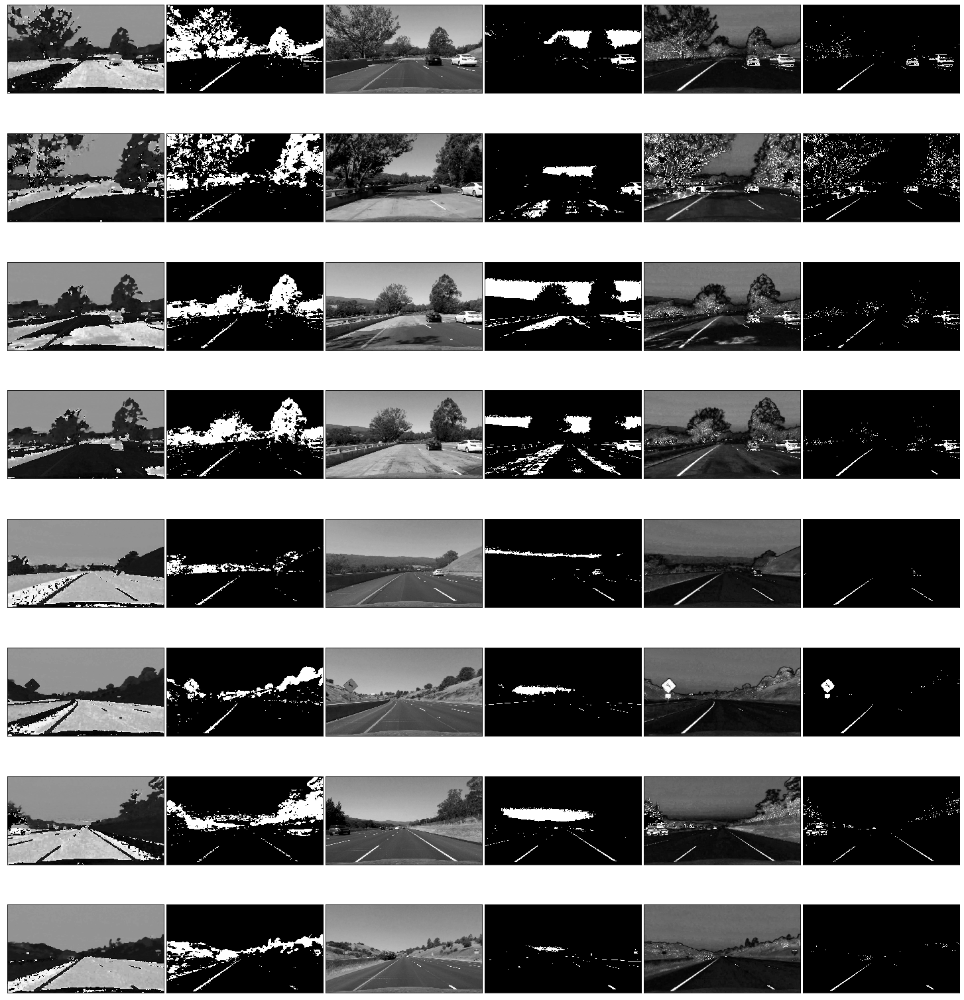

In [6]:
def convert_hls (image):
    hls = cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    binary_h = np.zeros_like(H)
    binary_l = np.zeros_like(L)
    binary_s = np.zeros_like(S)
    
    thresh_h = [18,100]
    thresh_l = [180,255]
    thresh_s = [180,255]
    binary_h[(H > thresh_h[0]) & (H <= thresh_h[1])] = 1
    binary_l[(L > thresh_l[0]) & (L<= thresh_l[1])] = 1
    binary_s[(S >thresh_s[0]) & (S<= thresh_s[1])] = 1
    
    return H,binary_h,L,binary_l,S,binary_s

show_images(multi_ret_map(convert_hls,test_images), cols=6)

In summary, S with a `[90,255]` threshold works well across all test images.
H with a `[18,100]` looks decent but we need to compare with hsv to see if it's usable
L is no good

Now let's see how HVS looks like:

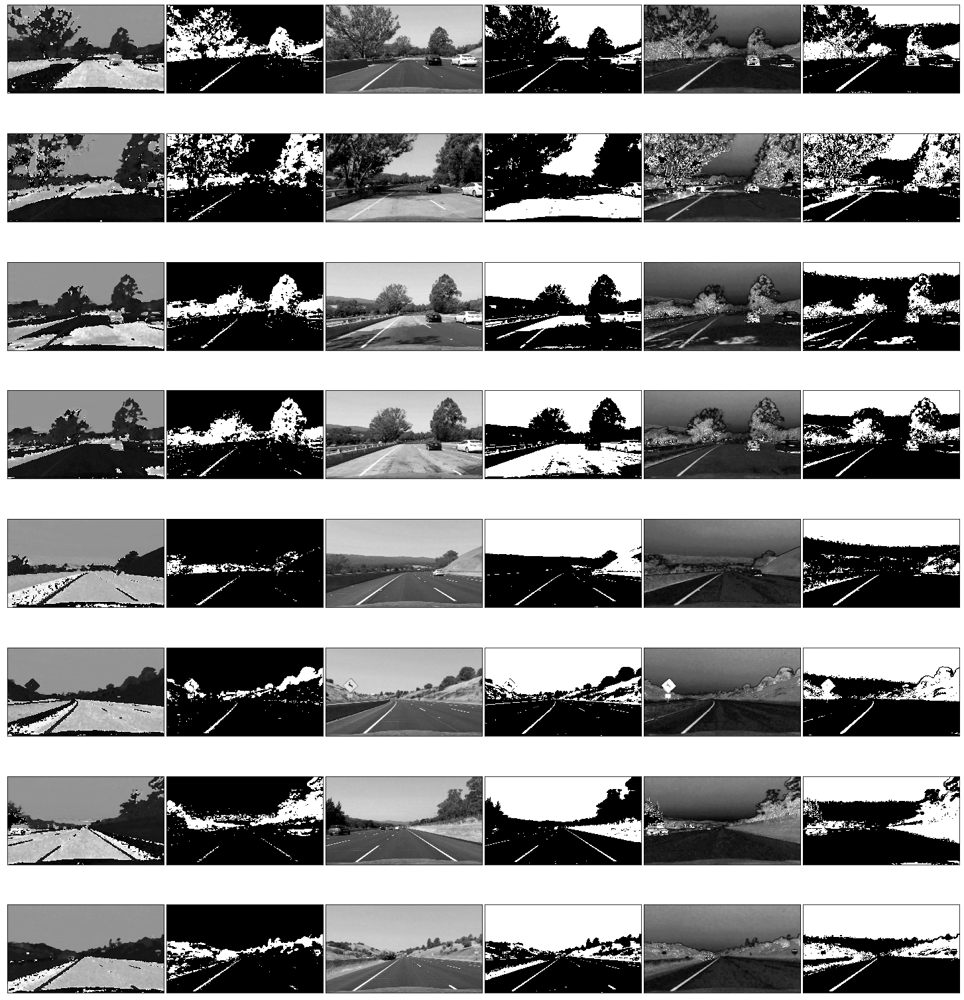

In [7]:
def convert_hsv (image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    H = hsv[:,:,0]
    S = hsv[:,:,1]
    V = hsv[:,:,2]
    binary_h = np.zeros_like(H)
    binary_v = np.zeros_like(V)
    binary_s = np.zeros_like(S)
    
    thresh_h = [18,100]
    thresh_v = [150,255]
    thresh_s = [90,255]
    binary_h[(H > thresh_h[0]) & (H <= thresh_h[1])] = 1
    binary_v[(V > thresh_v[0]) & (V<= thresh_v[1])] = 1
    binary_s[(S >thresh_s[0]) & (S<= thresh_s[1])] = 1
    return H,binary_h,V,binary_v,S,binary_s

show_images(multi_ret_map(convert_hsv,test_images), cols=6)

S in HSV detect yellow line super well, but it does not pick up white line at all.
S in HLS detect both yellow line and white line pretty well.

H in HSV and HLS behavior almost the same, we could use either of them.

L and V are influenced by the light pavement too much. We are not going to use those.

In summary, we could use S in HLS, H in HLS and R in RGB

## Gradient 
Use Sobel operator to calculate gray scale magnitude, direction of the gradient to find lane lines among all the other lines in the image

CPU times: user 913 ms, sys: 270 ms, total: 1.18 s
Wall time: 1.2 s
CPU times: user 293 ms, sys: 96.4 ms, total: 389 ms
Wall time: 406 ms


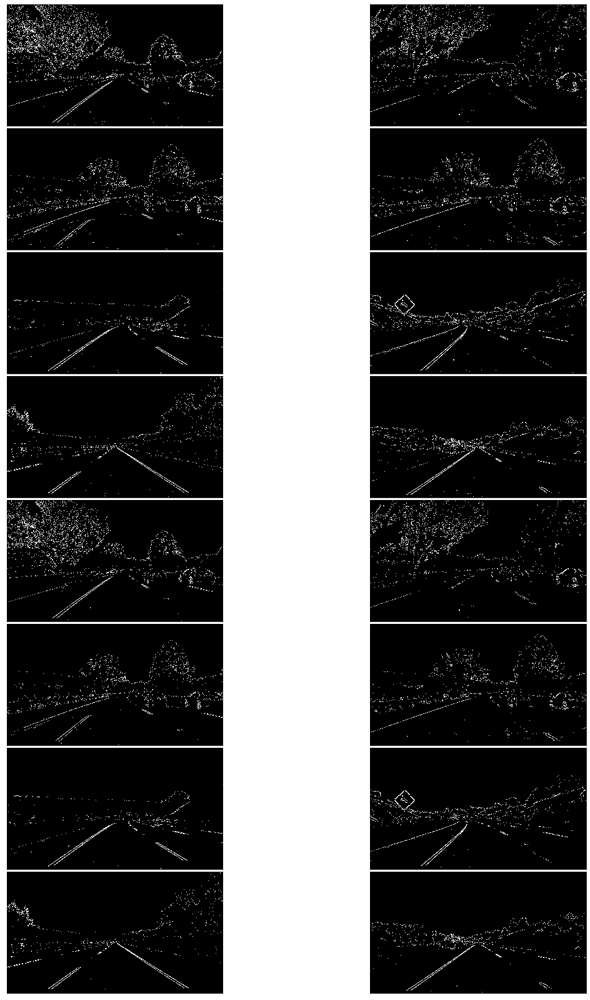

In [8]:
def abs_sobel_thresh(gray, orient='x', thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
#     gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
        
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def mag_threshold(gray, sobel_kernel=3, thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
#     gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1

    return binary_output

def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    
#     gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    abs_arctan = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(abs_arctan)
    binary_output[(abs_arctan >= thresh[0]) & (abs_arctan <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    
    return binary_output


def sobel_gradient (image, overdrive = True, ksize = 3,abs_thresh = (25,200),
                    mag_thresh = (40,150),dir_thresh = (0.7,1.3)):
    
    # Convert to gray scale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Apply each of the thresholding functions according to the compliexity
    gradx = abs_sobel_thresh(gray, orient='x', thresh=abs_thresh)
    grady = abs_sobel_thresh(gray, orient='y', thresh=abs_thresh)
    combined = np.zeros_like(grady)
    
    # Choose complexity True means more complicated calculation
    # If min complexity require only execute x and y gradient
    if overdrive: 
        mag_binary = mag_threshold(gray,sobel_kernel=ksize,thresh= mag_thresh)
        dir_binary = dir_threshold(gray, sobel_kernel=ksize, thresh=dir_thresh)
        combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    else:
        combined[(gradx == 1) & (grady == 1)] = 1       
        
    return combined
%time templist = list(map(sobel_gradient,test_images))

%time templist.extend(list(map(sobel_gradient,test_images,[False]*len(test_images))))

#templist = list(map(sobel_gradient,test_images,[False]*len(test_images)))
#templist = list(map(dir_threshold,test_images,[15]*len(test_images),[(0.7,1.3)]*len(test_images)))
#templist = list(map(mag_threshold,test_images,[15]*len(test_images),[(40,150)]*len(test_images)))
show_images(templist)


After tuning each Sobel function, I have reached following threshold parameters as good starting point:
```
abs_thresh = (25,200)
mag_thresh = (40,150)
dir_thresh = (0.7,1.3)
```
I combine the x,y direction sobel, magnitude and direction filter in `sobel_gradient()`. I also include a overdrive flag to save run time if need. For only doing xy direction, runtime is around 398ms and to do the full three function combine would take 1.28s. This is about almost 1s different computation time per frame later in the video processing.
```
CPU times: user 973 ms, sys: 308 ms, total: 1.28 s
Wall time: 1.48 s
CPU times: user 289 ms, sys: 110 ms, total: 398 ms
Wall time: 390 ms
```

## Combing color filter and gradient filter together
Now, let's build a complete image/frame processing logic by applying color space filter first and then applied above threshold filter to prepare for our lane detection pipeline.

In [9]:
# A function only process h and s channels
def convert_to_hs (image, thresh_h = [18,100], thresh_s = [90,255]):
    
    # First convert image to HLS and only take H and S
    hls = cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    S = hls[:,:,2]
    # Create Binary arrays
    binary_h = np.zeros_like(H)
    binary_s = np.zeros_like(S)
    
    binary_h[(H > thresh_h[0]) & (H <= thresh_h[1])] = 1
    binary_s[(S >thresh_s[0]) & (S<= thresh_s[1])] = 1
    
    return binary_h, binary_s
    

"""
Image process takes a frame iamge and return a binary image as an input of pipeline logic

Input: 
    image: a RGB image array 
    overdrive: boolean True mean complicated computing include all threshold methods, 
               False means simple computing only S threshold and xy graidents
Return:
    combined_binary: all the threhold binary combined
    color_binary: used to visuallize the two combines binary. Debugging use only

"""
def image_process (image, overdrive = False):
    # Fine tune all the threshold here
    thresh_h = [23,100]
    thresh_s = [170,255]
    thresh_r = [220,255]
    abs_thresh = (50,200)
    mag_thresh = (60,150)

    # Get binary H and S from hls color space
    binary_h, binary_s = convert_to_hs(image,thresh_h = thresh_h, thresh_s = thresh_s)
    combined_binary = np.zeros_like(binary_s)
    
    if overdrive:
        # Grab gradient result 
        gradient_binary = sobel_gradient(image,ksize=15,abs_thresh=abs_thresh,mag_thresh = mag_thresh)
        
        # Implement R threhold
        R =image[:,:,0]
        
        binary_r = np.zeros_like(R)
        binary_r[(R > thresh_r[0]) & (R <= thresh_r[1])] = 1
        
        # Combine R with H and S threshold binary
        color_thresh_binary = np.zeros_like(binary_s)
        color_thresh_binary[((binary_h == 1) & (binary_s ==1))|(binary_r ==1)] = 1
        
        # Create color binary to visualiize the logic combining
        color_binary = np.dstack((binary_r,color_thresh_binary,gradient_binary))*255
        # Combine all the binary
        combined_binary[(color_thresh_binary ==1)|(gradient_binary ==1)] = 1
    
    else:
        # Grab gradient result 
        gradient_binary = sobel_gradient(image,overdrive=overdrive,abs_thresh=abs_thresh)
        combined_binary[(binary_s ==1)|(gradient_binary ==1)] =1
        color_binary = np.dstack((np.zeros_like(gradient_binary),binary_s,gradient_binary))*255
    
    return combined_binary,color_binary


    

CPU times: user 438 ms, sys: 146 ms, total: 585 ms
Wall time: 544 ms


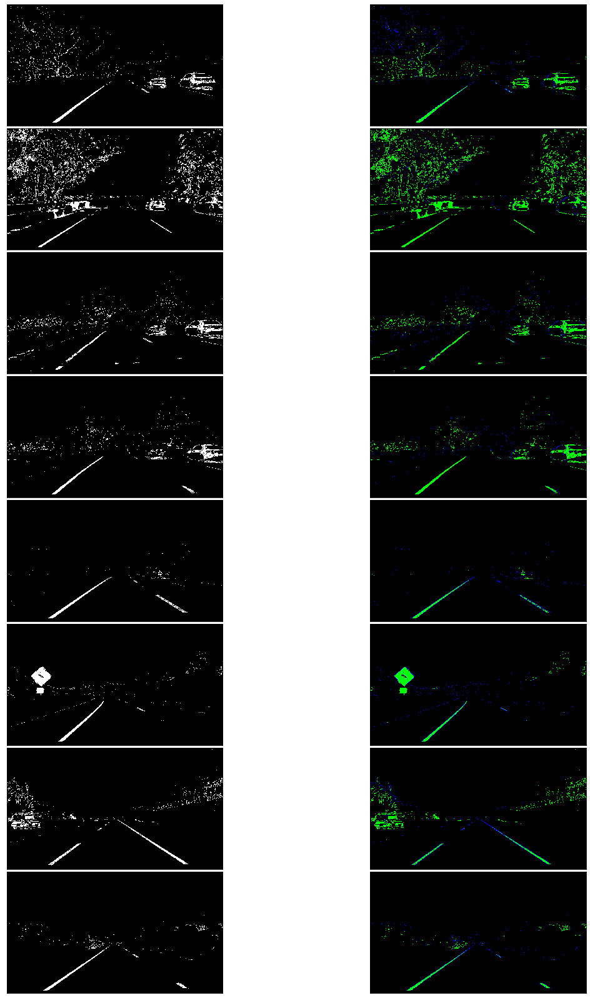

In [10]:
%time temp_img_list = multi_ret_map(image_process,test_images)
show_images(temp_img_list)

CPU times: user 1.52 s, sys: 339 ms, total: 1.86 s
Wall time: 1.86 s


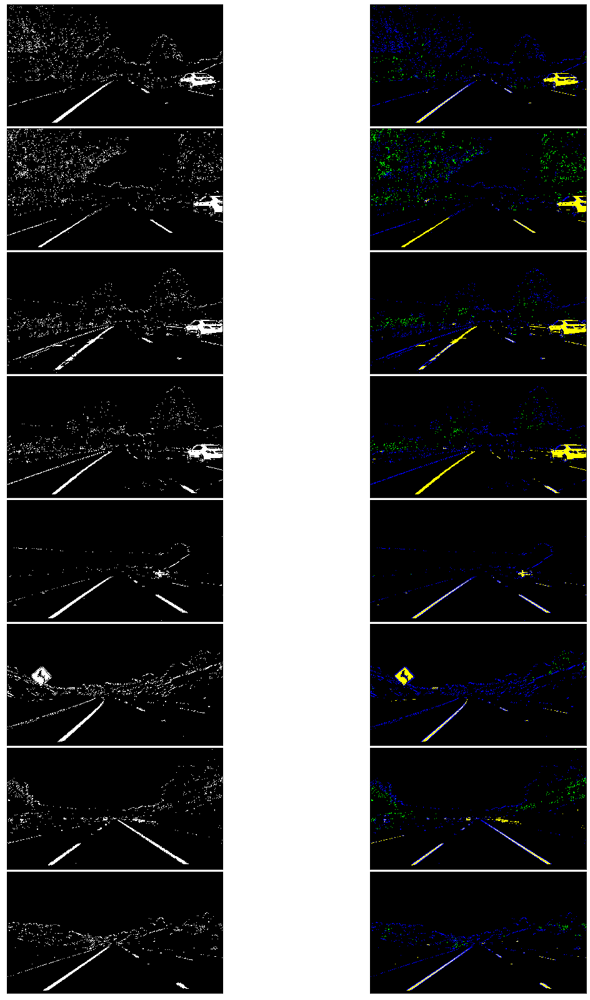

In [11]:
%time temp_list =list(map(image_process,test_images,[True]*len(test_images)))
result_list = []
for i in range(len(temp_list)):
    result_list.extend(temp_list[i])
        
show_images(result_list)

## Summary and Observation

By combining Red, S in HSL, H in HSL and gray scale gradient, I am able to detect lane pretty accurate across different environment base on the testing image   

However, a more accurate filter require more time to compute. I implement a flag to two types of threshold filtering for future usage.

I also notice when combining multiple threshold binary arrays, higher threshold would give a less noisy reading since I am combine or all the binary arrays.

Special note: I use "and" between H and S in HSL color thresholding to reduce unwanted shade area picked up by S.

## Perspective Transform Calculation
Now let's define trapezoid mask and preform perspective transform to an image


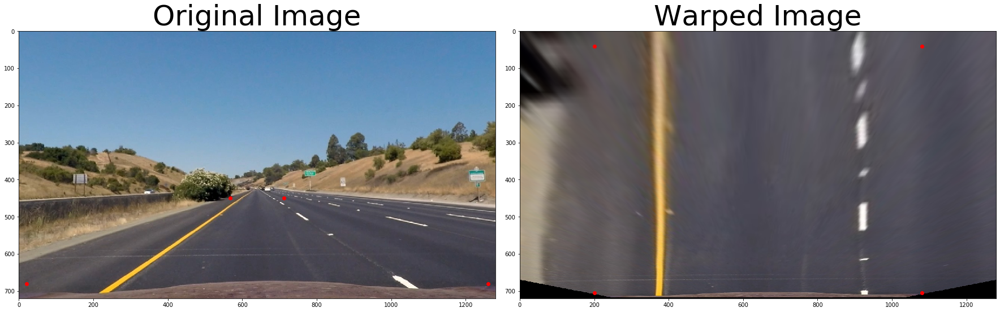

In [12]:
# Define the mask parameters. This function will adjust src and dst coordinates to different 
# size of images

# mask top width is the top width of the trapezoid
# x_offset is the offset on the bottom line X cooridate of the trapezoid
# y_offset is the offset on the bottom line Y cooridtate of the trapzoid
# dst_offset is the destination rectangle X offset 
def mask_image (img,mask_top_width = 145, x_offset = 20, y_offset=40, dst_offset = 200):

    imshape=img.shape
    # Calculate mask height
    img_y_mid = imshape[0]*0.5
    mask_height = int(img_y_mid*1.25)
    img_x_mid = int(imshape[1]*0.5)
    top_left = [img_x_mid - mask_top_width*0.5 , mask_height]
    top_right = [img_x_mid + mask_top_width*0.5 , mask_height]
    bottom_left = [x_offset,imshape[0]-y_offset]
    bottom_right = [imshape[1]-x_offset,imshape[0]-y_offset]

    # Define the source points
    src = np.float32([bottom_left,top_left,top_right,bottom_right])
    # Define destination points
    # 25 is hardcoded to move the lane line to the bottom of the image
    dst = np.float32([[dst_offset, imshape[0]-y_offset+25], [dst_offset, y_offset], 
                                     [imshape[1]-dst_offset, y_offset], 
                                     [imshape[1]-dst_offset, imshape[0]-y_offset+25]])
    return src, dst



def perspective_transform (undist,inverse = False,debug = False):
    src,dst = mask_image(undist)
    if inverse == False:
        M = cv2.getPerspectiveTransform(src,dst)
    else:
        M = cv2.getPerspectiveTransform(dst,src)
        
    img_size = (undist.shape[1], undist.shape[0])
    warped = cv2.warpPerspective(undist,M,img_size)
    
    if debug:
        return warped,src,dst
    else:
        return warped

# Test using straight lines1 
straight_img = mpimg.imread('test_images/straight_lines1.jpg')
undist = cv2.undistort(straight_img,mtx,dist,None,mtx)
warped,src,dst = perspective_transform(undist,debug =True)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
# prepare src point for scatter plot
x1=[]
y1=[]
for i in src:
    x1.append(i[0])
    y1.append(i[1])
ax1.scatter(x1,y1,color='r')

ax1.imshow(undist)
ax1.set_title('Original Image', fontsize=50)
x2=[]
y2=[]
for i in dst:
    x2.append(i[0])
    y2.append(i[1])
# print(src,'\n\n',dst)
ax2.scatter(x2,y2,color='r')
ax2.imshow(warped)
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


After tunning with the test images, I am going to use ` mask_top_width = 155, x_offset = 20, y_offset=40, dst_offset = 200` to get the src and dst coordinates for my Perspective Transform.

Now Let's apply this transform to a binary image after color and gradient threhold

<Figure size 432x288 with 0 Axes>

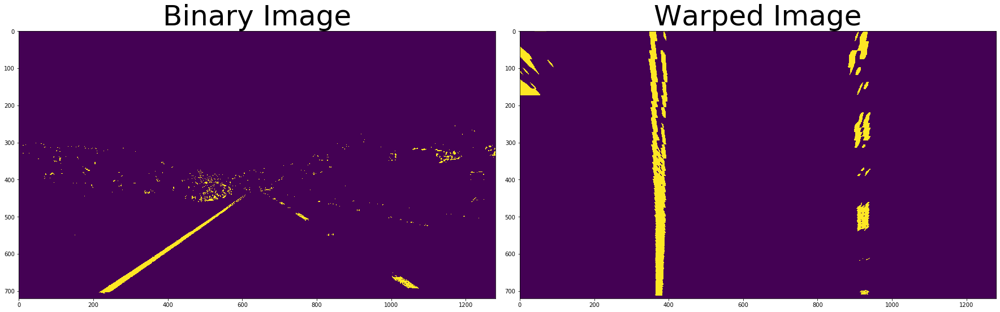

In [13]:
def binary_wrap_img (undist, overdrive = False, debug = False):
    
    src,dst = mask_image(undist)
    
    binary,color_binary = image_process(undist, overdrive)
    
    img_size = (img.shape[1], img.shape[0])

    warped = perspective_transform(binary)
    if debug: 
        f = plt.figure()
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(binary)
        ax1.set_title('Binary Image', fontsize=50)
        ax2.imshow(warped)
        ax2.set_title('Warped Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
    return warped
# %matplotlib inline
binary_wrap = binary_wrap_img(cv2.undistort(straight_img,mtx,dist,None,mtx)
,debug =True)

Now we have all basic image processing tools and functions we need to perform lane finding in a video!